In [1]:
!pip install imutils

  Preparing metadata (setup.py) ... - \ done
  Created wheel for imutils: filename=imutils-0.5.4-py3-none-any.whl size=25837 sha256=296790797eba07a781855b13645a80521b0d0d9fc4d33f4ca1f8908ba545b94d
  Stored in directory: /root/.cache/pip/wheels/85/cf/3a/e265e975a1e7c7e54eb3692d6aa4e2e7d6a3945d29da46f2d7
Successfully built imutils


In [2]:
import os
import random
from tqdm import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import random
from IPython.display import Image
import imutils   

In [3]:
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
import keras
import tensorflow.keras as Keras

import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator, array_to_img, img_to_array
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Conv2D, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import imutils    

In [4]:
from tensorflow.keras.preprocessing.image import load_img

In [5]:
import os


print(os.listdir('/kaggle/input/dataset-resized'))

['metal', 'glass', 'paper', 'trash', 'cardboard', 'plastic']


In [6]:
import os
import shutil

# Create directories for training data
os.makedirs('/kaggle/working/TrashNet-Data/Training/cardboard', exist_ok=True)
os.makedirs('/kaggle/working/TrashNet-Data/Training/glass', exist_ok=True)
os.makedirs('/kaggle/working/TrashNet-Data/Training/metal', exist_ok=True)
os.makedirs('/kaggle/working/TrashNet-Data/Training/plastic', exist_ok=True)
os.makedirs('/kaggle/working/TrashNet-Data/Training/paper', exist_ok=True)
os.makedirs('/kaggle/working/TrashNet-Data/Training/trash', exist_ok=True)

# Create directories for testing data
os.makedirs('/kaggle/working/TrashNet-Data/Testing/cardboard', exist_ok=True)
os.makedirs('/kaggle/working/TrashNet-Data/Testing/glass', exist_ok=True)
os.makedirs('/kaggle/working/TrashNet-Data/Testing/metal', exist_ok=True)
os.makedirs('/kaggle/working/TrashNet-Data/Testing/plastic', exist_ok=True)
os.makedirs('/kaggle/working/TrashNet-Data/Testing/paper', exist_ok=True)
os.makedirs('/kaggle/working/TrashNet-Data/Testing/trash', exist_ok=True)

# Specify the source directory of the TrashNet dataset
source_dir = '/kaggle/input/dataset-resized'

# Move images into the corresponding training and testing directories
for class_name in ['cardboard', 'glass', 'metal', 'plastic','paper','trash']:
    class_images = os.listdir(os.path.join(source_dir, class_name))
    train_images = class_images[:int(len(class_images) * 0.8)]  # 80% for training
    test_images = class_images[int(len(class_images) * 0.8):]   # 20% for testing

    # Copy training images
    for img in train_images:
        src_path = os.path.join(source_dir, class_name, img)
        dst_path = os.path.join('/kaggle/working/TrashNet-Data/Training', class_name, img)
        shutil.copy2(src_path, dst_path)  # Use copy2 instead of move

    # Copy testing images
    for img in test_images:
        src_path = os.path.join(source_dir, class_name, img)
        dst_path = os.path.join('/kaggle/working/TrashNet-Data/Testing', class_name, img)
        shutil.copy2(src_path, dst_path)  # Use copy2 instead of move

In [7]:
#create classes
classes = os.listdir('/kaggle/working/TrashNet-Data/Training')
classes

['paper', 'plastic', 'trash', 'cardboard', 'metal', 'glass']

In [8]:
 #create directory for training data
os.mkdir('/kaggle/working/Crop-TrashNet')
os.mkdir('/kaggle/working/Crop-TrashNet/cardboard')
os.mkdir('/kaggle/working/Crop-TrashNet/glass')
os.mkdir('/kaggle/working/Crop-TrashNet/metal')
os.mkdir('/kaggle/working/Crop-TrashNet/plastic')
os.mkdir('/kaggle/working/Crop-TrashNet/paper')
os.mkdir('/kaggle/working/Crop-TrashNet/trash')

In [9]:
#create directory for testing data
os.mkdir('/kaggle/working/Test-Data')
os.mkdir('/kaggle/working/Test-Data/cardboard')
os.mkdir('/kaggle/working/Test-Data/glass')
os.mkdir('/kaggle/working/Test-Data/metal')
os.mkdir('/kaggle/working/Test-Data/plastic')
os.mkdir('/kaggle/working/Test-Data/paper')
os.mkdir('/kaggle/working/Test-Data/trash')

In [10]:
#specify directory
train_dir = '/kaggle/working/TrashNet-Data/Training/'
test_dir = '/kaggle/working/TrashNet-Data/Testing/'

In [11]:
files_path_dict = {}

for c in classes:
    class_dir = os.path.join(train_dir, c)  # Correctly join paths
    if os.path.exists(class_dir):  # Check if the directory exists
        files_path_dict[c] = list(map(lambda x: os.path.join(class_dir, x), os.listdir(class_dir)))
    else:
        print(f"Directory does not exist: {class_dir}")

In [12]:
files_path_dict.keys()

dict_keys(['paper', 'plastic', 'trash', 'cardboard', 'metal', 'glass'])

In [13]:
files_path_dict['glass'][0]

'/kaggle/working/TrashNet-Data/Training/glass/glass313.jpg'

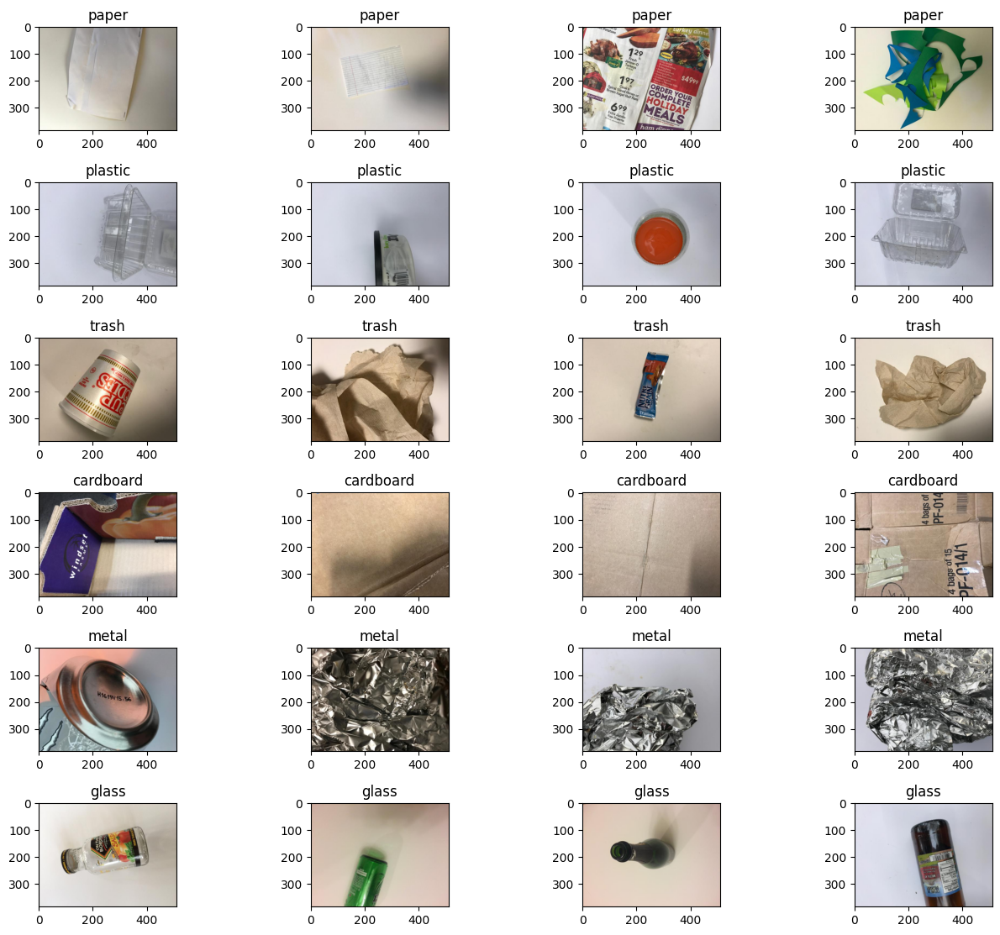

In [14]:
plt.figure(figsize = (16,16))
index = 0
for c in classes:
  random.shuffle(files_path_dict[c])
  path_list = files_path_dict[c][:5]

  for i in range(1, 5):
    index += 1
    plt.subplot(7, 4, index)
    plt.imshow(load_img(path_list[i]))
    plt.title(c)
plt.subplots_adjust(hspace=0.5)  
plt.show()

In [15]:
#check the number of images in each class in the training dataset
No_images_per_class = []
Class_name = []

for i in os.listdir('/kaggle/working/TrashNet-Data/Training'):
  train_class = os.listdir(os.path.join('/kaggle/working/TrashNet-Data/Training', i))
  No_images_per_class.append(len(train_class))
  Class_name.append(i)
  print('Number of images in {} = {} \n'.format(i, len(train_class)))

Number of images in paper = 475 

Number of images in plastic = 385 

Number of images in trash = 109 

Number of images in cardboard = 322 

Number of images in metal = 328 

Number of images in glass = 400 



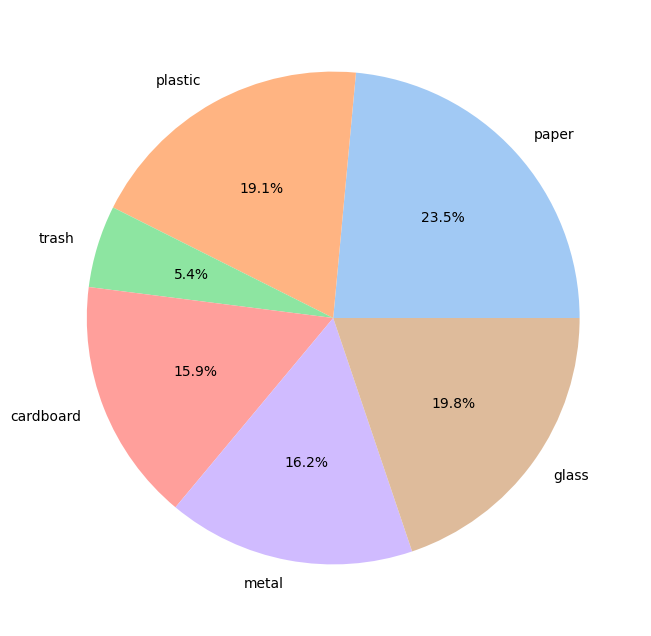

In [16]:
#visualize class distribution in train set
plt.figure(figsize=(8, 8))
colors = sns.color_palette('pastel')
plt.pie(No_images_per_class, 
        labels = Class_name, 
        autopct = '%1.1f%%',
        colors=colors)
plt.show()

In [17]:
def crop_image(image, plot=False):
    
    #convert to grayscale
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    #blur
    img_gray = cv2.GaussianBlur(img_gray, (5, 5), 0)
    
    #apply binary threshhold
    img_thresh = cv2.threshold(img_gray, 45, 255, cv2.THRESH_BINARY)[1]

    #apply erosion
    img_thresh = cv2.erode(img_thresh, None, iterations=2)

    #dilate images
    img_thresh = cv2.dilate(img_thresh, None, iterations=2)

    #find shapes or the contour of images
    contours = cv2.findContours(img_thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    #grab contours
    contours = imutils.grab_contours(contours)

    #find biggest contour
    c = max(contours, key=cv2.contourArea)

    #extract contour positions
    extLeft = tuple(c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])
    
    #generate new image
    new_image = image[extTop[1]:extBot[1], extLeft[0]:extRight[0]]            

    #plot
    if plot:
        plt.figure(figsize=(15, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.tick_params(axis='both', which='both', top=False, bottom=False, left=False, right=False,labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        plt.title('Original Image')
        plt.subplot(1, 2, 2)
        plt.imshow(new_image)
        plt.tick_params(axis='both', which='both',top=False, bottom=False, left=False, right=False,labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        plt.title('Cropped Image')
        plt.show()
    
    return new_image

In [18]:
#crop training images and save it to the directory we previously created
cardboard = train_dir + 'cardboard'
glass = train_dir + 'glass'
metal = train_dir + 'metal'
plastic = train_dir + 'plastic'
paper = train_dir + 'paper'
trash = train_dir + 'trash'

j = 0
for i in tqdm(os.listdir(cardboard)):
  path = os.path.join(cardboard, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (224, 224))
    save_path = '/kaggle/working/Crop-TrashNet/cardboard/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(glass)):
  path = os.path.join(glass, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (224, 224))
    save_path = '/kaggle/working/Crop-TrashNet/glass/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

j = 0
for i in tqdm(os.listdir(metal)):
  path = os.path.join(metal, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (224, 224))
    save_path = '/kaggle/working/Crop-TrashNet/metal/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

j = 0
for i in tqdm(os.listdir(plastic)):
  path = os.path.join(plastic, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (224, 224))
    save_path = '/kaggle/working/Crop-TrashNet/plastic/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  
j = 0
for i in tqdm(os.listdir(paper)):
  path = os.path.join(paper, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (224, 224))
    save_path = '/kaggle/working/Crop-TrashNet/paper/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  
j = 0
for i in tqdm(os.listdir(trash)):
  path = os.path.join(trash, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (224, 224))
    save_path = '/kaggle/working/Crop-TrashNet/trash/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

100%|██████████| 109/109 [00:00<00:00, 365.06it/s]


In [19]:
#crop testing images and save it to the directory we previously created
test_cardboard = test_dir + 'cardboard'
test_glass = test_dir + 'glass'
test_metal = test_dir + 'metal'
test_plastic = test_dir + 'plastic'
test_paper = test_dir + 'paper'
test_trash = test_dir + 'trash'

j = 0
for i in tqdm(os.listdir(test_cardboard)):
  path = os.path.join(test_cardboard, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (224, 224))
    save_path = '/kaggle/working/Test-Data/cardboard/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(test_glass)):
  path = os.path.join(test_glass, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (224, 224))
    save_path = '/kaggle/working/Test-Data/glass/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

j = 0
for i in tqdm(os.listdir(test_metal)):
  path = os.path.join(test_metal, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (224, 224))
    save_path = '/kaggle/working/Test-Data/metal/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

j = 0
for i in tqdm(os.listdir(test_plastic)):
  path = os.path.join(test_plastic, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (224, 224))
    save_path = '/kaggle/working/Test-Data/plastic/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  
j = 0
for i in tqdm(os.listdir(test_paper)):
  path = os.path.join(test_paper, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (224, 224))
    save_path = '/kaggle/working/Test-Data/paper/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  
j = 0
for i in tqdm(os.listdir(test_trash)):
  path = os.path.join(test_trash, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (224, 224))
    save_path = '/kaggle/working/Test-Data/trash/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

100%|██████████| 28/28 [00:00<00:00, 369.22it/s]


In [20]:
#use Image Data Generator to perform this task
#train set
datagen = ImageDataGenerator(rotation_range=10,
                             height_shift_range=0.2,
                             horizontal_flip=True,
                             validation_split=0.2)

train_data = datagen.flow_from_directory('/kaggle/working/Crop-TrashNet/',
                                         target_size=(224, 224),
                                         batch_size=32,
                                         class_mode='categorical',
                                         subset='training')

valid_data = datagen.flow_from_directory('/kaggle/working/Crop-TrashNet/',
                                         target_size=(224, 224),
                                         batch_size=32,
                                         class_mode='categorical',
                                         subset='validation')

#test set
test_datagen = ImageDataGenerator()

test_data = datagen.flow_from_directory('/kaggle/working/Crop-TrashNet/',
                                         target_size=(224, 224),
                                        class_mode='categorical',
                                        shuffle=False)
                                        

Found 1617 images belonging to 6 classes.
Found 402 images belonging to 6 classes.
Found 2019 images belonging to 6 classes.


In [21]:
#view the class dictionary
print(train_data.class_indices)
print(test_data.class_indices)

{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}
{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}


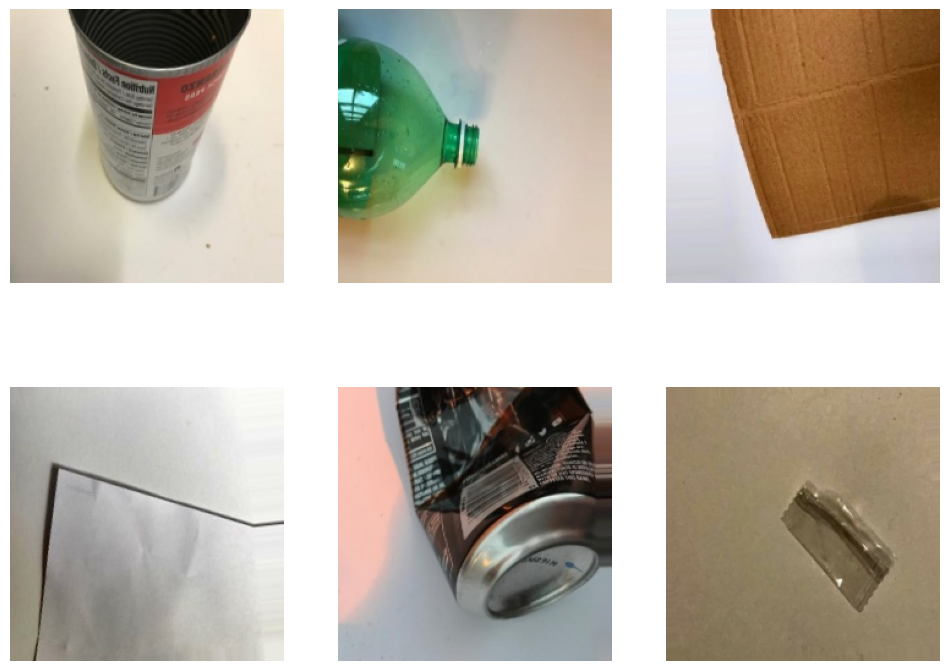

In [22]:
#view the augmented data
sample_x, sample_y = next(train_data)
plt.figure(figsize=(12, 9))
for i in range(6):
  plt.subplot(2, 3, i+1)
  sample = array_to_img(sample_x[i])
  plt.axis('off')
  plt.grid(False)
  plt.imshow(sample)
plt.show()

In [23]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0

def create_model():
    base_model = EfficientNetB0(
        weights='imagenet',
        include_top=False,
            input_shape=(224, 224, 3)  # Note: Input shape for EfficientNetB0 is (224, 224, 3)
    )
    x = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
    x = tf.keras.layers.Dense(len(train_data.class_indices), activation='softmax')(x)
    model = tf.keras.Model(inputs=base_model.input, outputs=x)
    return model

In [24]:
# Create and compile the model
model = create_model()
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)



16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [25]:
# Train the model before using for GradCAM or Guided Backpropagation
# Example training step (add epochs as required):
history = model.fit(train_data, validation_data=valid_data, epochs=10)



Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1730872351.093070     105 service.cc:145] XLA service 0x78a898003990 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730872351.093146     105 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


 1/51 ━━━━━━━━━━━━━━━━━━━━ 1:08:31 82s/step - accuracy: 0.0625 - loss: 1.9338

I0000 00:00:1730872396.567128     105 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


51/51 ━━━━━━━━━━━━━━━━━━━━ 153s 1s/step - accuracy: 0.6268 - loss: 0.9895 - val_accuracy: 0.5970 - val_loss: 1.3254
Epoch 2/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 22s 378ms/step - accuracy: 0.9121 - loss: 0.2517 - val_accuracy: 0.7388 - val_loss: 1.0047
Epoch 3/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 22s 377ms/step - accuracy: 0.9300 - loss: 0.1864 - val_accuracy: 0.7338 - val_loss: 0.9630
Epoch 4/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 22s 378ms/step - accuracy: 0.9540 - loss: 0.1356 - val_accuracy: 0.7239 - val_loss: 1.4534
Epoch 5/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 374ms/step - accuracy: 0.9420 - loss: 0.1525 - val_accuracy: 0.8507 - val_loss: 0.6166
Epoch 6/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 22s 380ms/step - accuracy: 0.9585 - loss: 0.1338 - val_accuracy: 0.7836 - val_loss: 0.9647
Epoch 7/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 21s 373ms/step - accuracy: 0.9588 - loss: 0.1137 - val_accuracy: 0.8209 - val_loss: 0.8413
Epoch 8/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 22s 376ms/step - accuracy: 0.9690 - loss: 0.0937 - val_accuracy: 0.8930 

In [26]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 12,087,727 (46.11 MB)

 Trainable params: 4,015,234 (15.32 MB)

 Non-trainable params: 42,023 (164.16 KB)

 Optimizer params: 8,030,470 (30.63 MB)

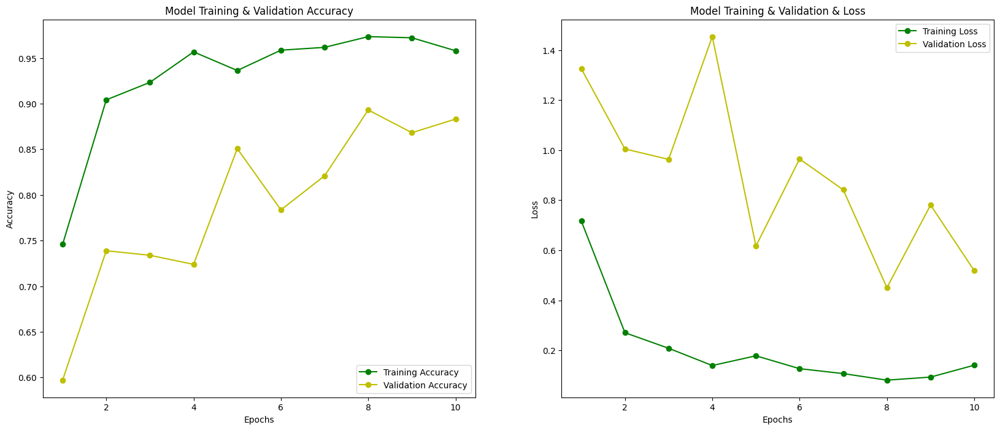

In [27]:
fig , ax = plt.subplots(1,2)
fig.set_size_inches(20, 8)

train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

ax[0].plot(epochs , train_acc , 'g-o' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'y-o' , label = 'Validation Accuracy')
ax[0].set_title('Model Training & Validation Accuracy')
ax[0].legend(loc = 'lower right')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'y-o' , label = 'Validation Loss')
ax[1].set_title('Model Training & Validation & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [28]:
print('Train accuracy & loss:', model.evaluate(train_data))
print('\n')
print('Test accuracy & loss:', model.evaluate(test_data))

51/51 ━━━━━━━━━━━━━━━━━━━━ 19s 369ms/step - accuracy: 0.9763 - loss: 0.0827
Train accuracy & loss: [0.07877428829669952, 0.9764996767044067]


64/64 ━━━━━━━━━━━━━━━━━━━━ 24s 375ms/step - accuracy: 0.9637 - loss: 0.1403
Test accuracy & loss: [0.1635827273130417, 0.9554234743118286]


In [29]:
# Assuming valid_data contains images and labels
y_pred = model.predict(test_data)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert predictions to class labels

# True labels from validation data (assuming valid_data is a generator)
y_true = test_data.classes

# Classification report for precision, recall, f1-score
report = classification_report(y_true, y_pred_classes)
print(report)

64/64 ━━━━━━━━━━━━━━━━━━━━ 29s 383ms/step
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       322
           1       0.96      0.95      0.95       400
           2       0.94      0.94      0.94       328
           3       0.98      0.98      0.98       475
           4       0.94      0.97      0.95       385
           5       0.94      0.82      0.87       109

    accuracy                           0.96      2019
   macro avg       0.95      0.94      0.95      2019
weighted avg       0.96      0.96      0.96      2019



In [30]:
y_test = test_data.classes

#make prediction
yhat_test = np.argmax(model.predict(test_data), axis=1)

64/64 ━━━━━━━━━━━━━━━━━━━━ 20s 317ms/step


In [31]:
import itertools
def ConfusionMatrixDisplay(cm, classes,
                          normalize = False,
                          title = 'Confusion Matrix',
                          cmap = plt.cm.Blues):
    
    plt.figure(figsize = (6,6))
    plt.imshow(cm, interpolation = 'nearest', cmap = cmap)
    plt.title(title)
    plt.colorbar()
    plt.grid(False)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation = 90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]

    thresh = cm.max() / 2.
    cm = np.round(cm,2)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 fontsize = 12,
                 horizontalalignment = "center",
                 color = "white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

[[318   0   1   2   0   1]
 [  2 373  11   1  10   3]
 [  3   7 311   1   5   1]
 [  4   1   2 462   5   1]
 [  4  10   2   1 368   0]
 [  3   0   4   2  10  90]]


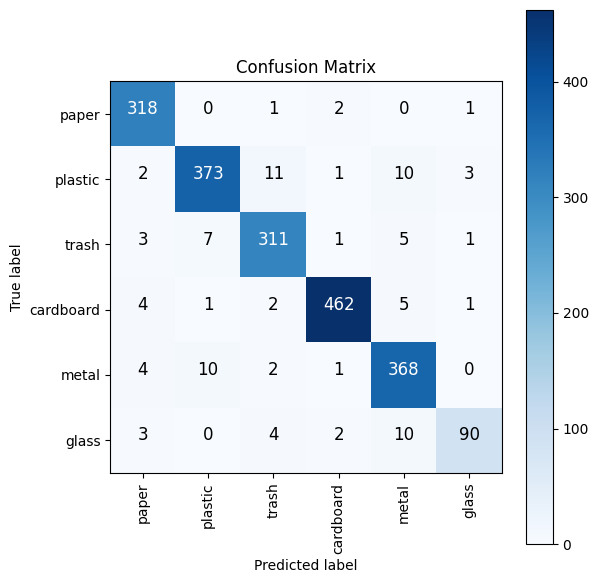

In [32]:
cm = confusion_matrix(y_test, yhat_test)
print(cm)

#plot
ConfusionMatrixDisplay(cm, classes, normalize=False)

In [33]:
import numpy as np
from tensorflow.keras.preprocessing import image

In [34]:
from tensorflow.keras import backend as K

In [35]:
@tf.custom_gradient
def guidedRelu(x):
    def grad(dy):
        return tf.cast(dy > 0, "float32") * tf.cast(x > 0, "float32") * dy
    return tf.nn.relu(x), grad

class GuidedBackprop:
    def __init__(self, model, layerName=None):
        self.model = model
        self.layerName = layerName or self.find_target_layer()
        self.gbModel = self.build_guided_model()

    def find_target_layer(self):
        # Find the last 4D layer in the model (usually a convolutional layer)
        for layer in reversed(self.model.layers):
            if len(layer.output_shape) == 4:
                return layer.name
        raise ValueError("Could not find a 4D layer. Cannot apply Guided Backpropagation")

    def build_guided_model(self):
        gbModel = Model(inputs=self.model.inputs, outputs=self.model.get_layer(self.layerName).output)

        # Modify all ReLU activations to guidedReLU
        for layer in gbModel.layers[1:]:
            if hasattr(layer, "activation") and layer.activation == tf.keras.activations.relu:
                layer.activation = guidedRelu

        return gbModel

    def guided_backprop(self, images, upsample_size):
        """Compute the guided backpropagation for an input image."""
        with tf.GradientTape() as tape:
            inputs = tf.cast(images, tf.float32)
            tape.watch(inputs)
            outputs = self.gbModel(inputs)

        grads = tape.gradient(outputs, inputs)[0]
        saliency = cv2.resize(np.asarray(grads), upsample_size)
        return saliency

def deprocess_image(x):
    x = x.copy()
    x -= x.mean()
    x /= (x.std() + K.epsilon())
    x *= 0.25
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    if K.image_data_format() == 'channels_first':
        x = x.transpose((1, 2, 0))
    x = np.clip(x, 0, 255).astype('uint8')
    return x



In [36]:
gb = GuidedBackprop(model=model, layerName='top_conv')

In [37]:
def visualize_guided_backprop(image_path, gb_model, target_class_idx):
    # Load and preprocess the image
    original_image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
    original_image_array = tf.keras.preprocessing.image.img_to_array(original_image)
    original_image_array = np.expand_dims(original_image_array, axis=0)

    # Run guided backpropagation
    saliency = gb_model.guided_backprop(original_image_array, upsample_size=(224, 224))

    # Normalize the output
    saliency = deprocess_image(saliency)

    # Create a figure to display both images side by side
    plt.figure(figsize=(12, 6))

    # Plot original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_image)
    plt.axis('off')
    plt.title("Original Image")

    # Plot guided backpropagation result
    plt.subplot(1, 2, 2)
    plt.imshow(saliency)
    plt.axis('off')
    plt.title(f"Guided Backpropagation for class {target_class_idx}")

    plt.tight_layout()
    plt.show()

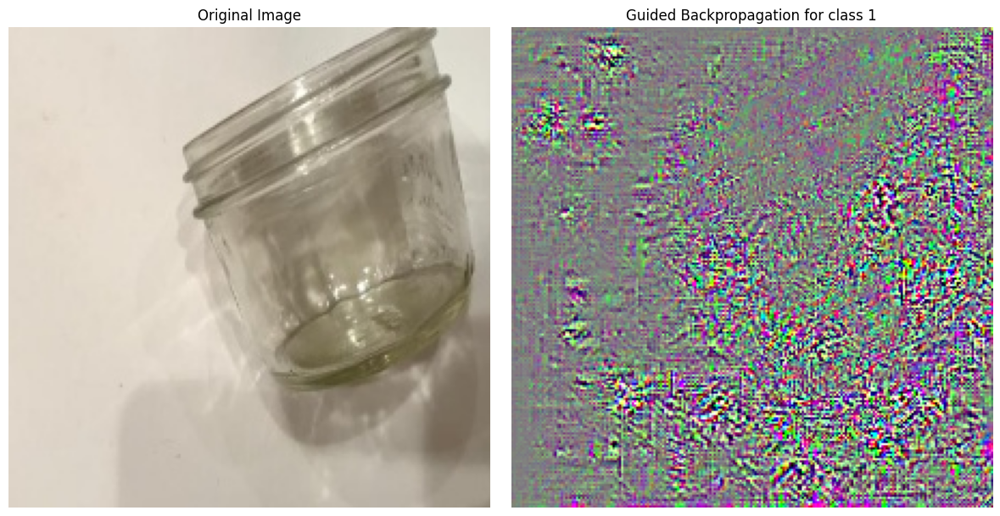

In [38]:


# Example usage:
#{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}
image_path = '/kaggle/working/Test-Data/glass/66.jpg'  # Replace with your image path
class_index = 1 # Set this to the index of the class you want to visualize (0-5)

visualize_guided_backprop(image_path, gb, class_index)

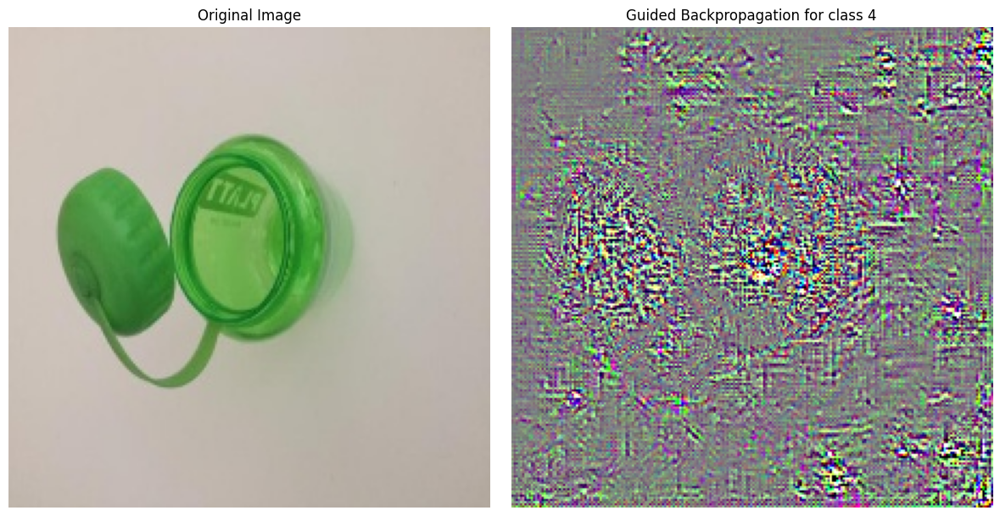

In [39]:


# Example usage:
#{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}
image_path = '/kaggle/working/Test-Data/plastic/42.jpg'  # Replace with your image path
class_index = 4 # Set this to the index of the class you want to visualize (0-5)

visualize_guided_backprop(image_path, gb, class_index)

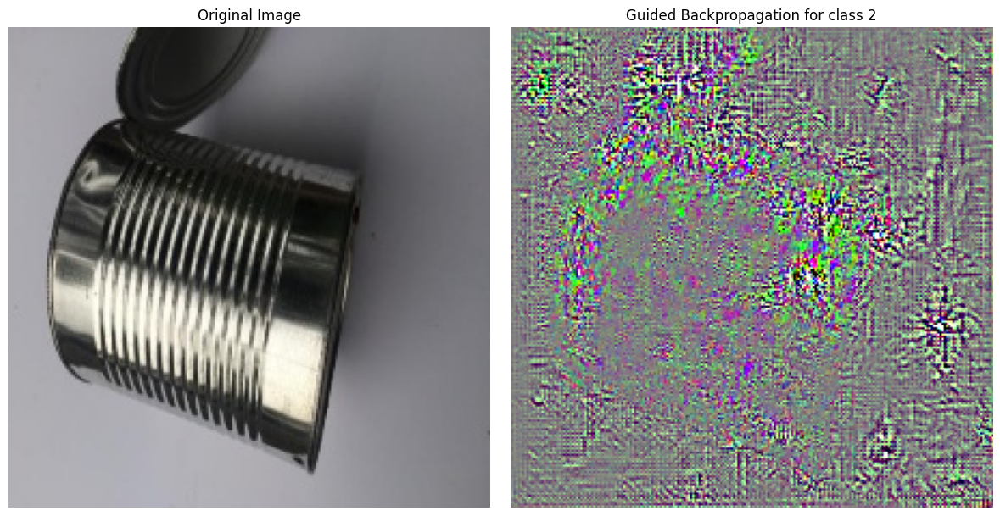

In [40]:
# Example usage:
#{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}
image_path = '/kaggle/working/Test-Data/metal/1.jpg'  # Replace with your image path
class_index = 2 # Set this to the index of the class you want to visualize (0-5)

visualize_guided_backprop(image_path, gb, class_index)

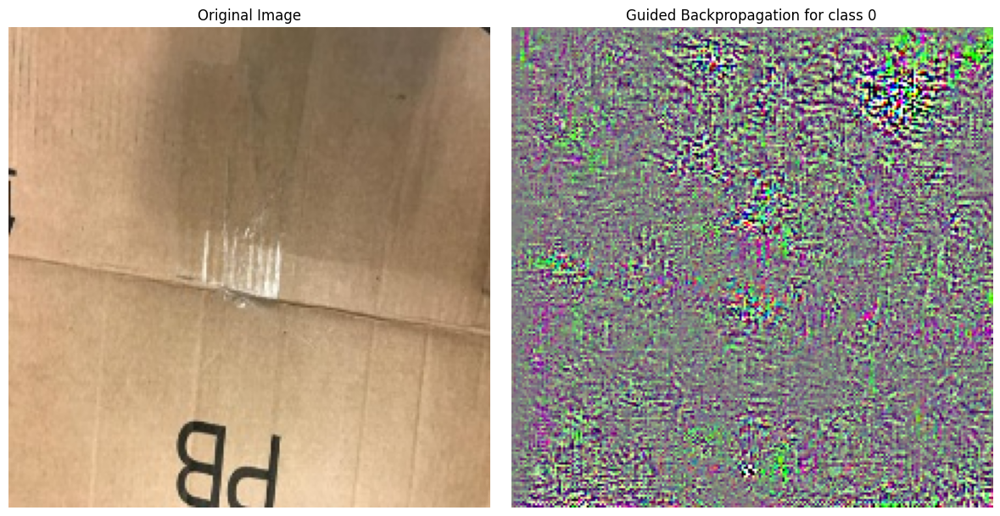

In [41]:
# Example usage:
#{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}
image_path = '/kaggle/working/Test-Data/cardboard/10.jpg'  # Replace with your image path
class_index = 0 # Set this to the index of the class you want to visualize (0-5)

visualize_guided_backprop(image_path, gb, class_index)

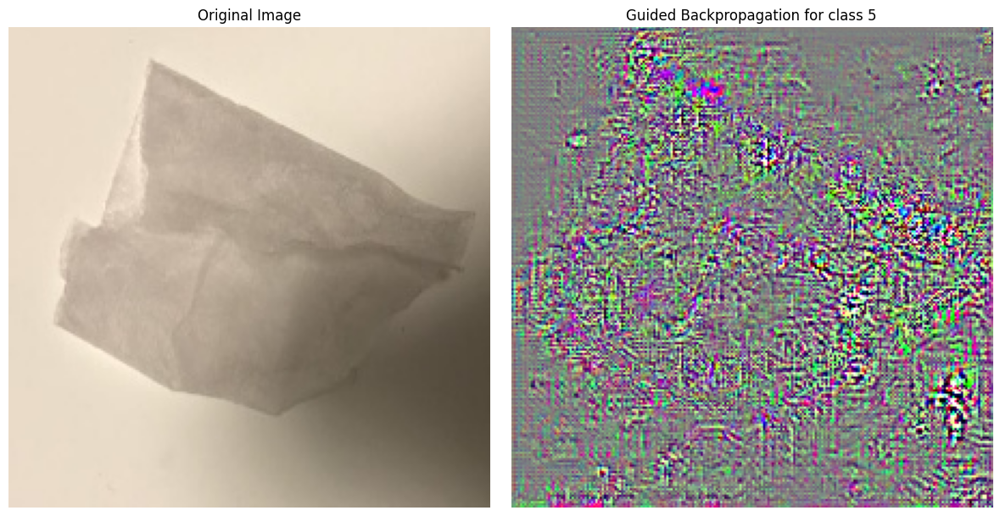

In [42]:
# Example usage:
#{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}
image_path = '/kaggle/working/Test-Data/trash/11.jpg'  # Replace with your image path
class_index = 5 # Set this to the index of the class you want to visualize (0-5)

visualize_guided_backprop(image_path, gb, class_index)

In [43]:
import tensorflow.keras as Keras

In [44]:
def VizGradCAM(model, image, interpolant=0.5, plot_results=True):
    """VizGradCAM - Displays GradCAM based on Keras / TensorFlow models
    using the gradients from the last convolutional layer.
    Parameters:
    model (keras.model): Compiled Model with Weights Loaded
    image: Image to Perform Inference On
    plot_results (boolean): True - Function Plots using PLT
                            False - Returns Heatmap Array
    Returns:
    Heatmap Array?
    """
    # Sanity check
    assert (interpolant > 0 and interpolant < 1), "Heatmap Interpolation Must Be Between 0 - 1"

    # STEP 1: Preprocess image and make prediction using our model
    original_img = np.asarray(image, dtype=np.float32)
    img = np.expand_dims(original_img, axis=0)
    prediction = model.predict(img)
    prediction_idx = np.argmax(prediction)

    # STEP 2: Create new model
    last_conv_layer = next(x for x in model.layers[::-1] if isinstance(x, Keras.layers.Conv2D))
    
    # Use last_conv_layer.output directly instead of getting its layer name
    gradient_model = Model(inputs=model.input, outputs=[last_conv_layer.output, model.output])

    # Compute gradient of top predicted class
    with tf.GradientTape() as tape:
        conv2d_out, prediction = gradient_model(img)
        loss = prediction[:, prediction_idx]

    # Gradient computation
    gradients = tape.gradient(loss, conv2d_out)

    output = conv2d_out[0]
    weights = tf.reduce_mean(gradients[0], axis=(0, 1))

    activation_map = np.zeros(output.shape[0:2], dtype=np.float32)
    
    for idx, weight in enumerate(weights):
        activation_map += weight * output[:, :, idx]

    activation_map = cv2.resize(activation_map.numpy(), 
                                (original_img.shape[1], 
                                 original_img.shape[0]))
    
    activation_map = np.maximum(activation_map, 0)
    
    activation_map = (activation_map - activation_map.min()) / (activation_map.max() - activation_map.min())
    
    activation_map = np.uint8(255 * activation_map)

    heatmap = cv2.applyColorMap(activation_map, cv2.COLORMAP_JET)

    original_img = np.uint8((original_img - original_img.min()) / (original_img.max() - original_img.min()) * 255)
    
    cvt_heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    
    if plot_results:
        plt.imshow(np.uint8(original_img * interpolant + cvt_heatmap * (1 - interpolant)))
        plt.axis('off')
        plt.show()
    else:
        return cvt_heatmap

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


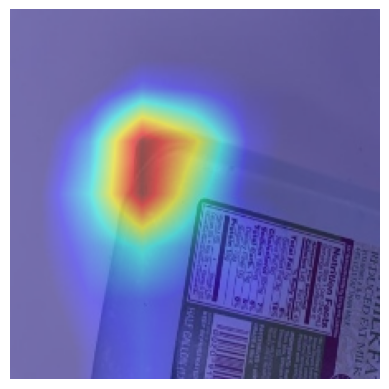

In [45]:
test_img = cv2.imread("/kaggle/working/Test-Data/plastic/86.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


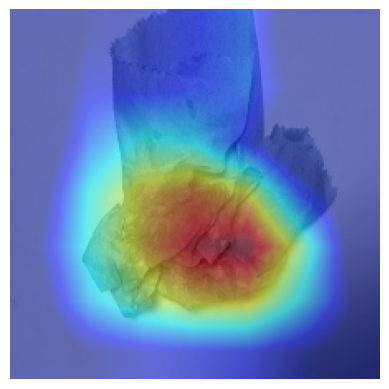

In [46]:
test_img = cv2.imread("/kaggle/working/Test-Data/trash/3.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing.image import img_to_array, load_img



In [48]:
def guided_gradcam(model, guided_backprop_model, image_path, target_class_idx, interpolant=0.5):
    original_image = load_img(image_path, target_size=(224, 224))
    original_image_array = img_to_array(original_image)
    processed_image = np.expand_dims(original_image_array, axis=0)
    
    # Generate Grad-CAM heatmap
    heatmap = VizGradCAM(model, original_image_array, interpolant=interpolant, plot_results=False)

    # Generate Guided Backpropagation saliency map
    saliency = guided_backprop_model.guided_backprop(processed_image, upsample_size=(224, 224))
    
    # Combine Grad-CAM and Guided Backpropagation to get Guided Grad-CAM
    guided_gradcam_result = deprocess_image(saliency * heatmap)
    
    # Display results
    plt.figure(figsize=(20, 5))

    # Plot original image
    plt.subplot(1, 4, 1)
    plt.imshow(original_image)
    plt.axis('off')
    plt.title("Original Image")

    # Plot Grad-CAM
    plt.subplot(1, 4, 2)
    plt.imshow(heatmap)
    plt.axis('off')
    plt.title("Grad-CAM")

    # Plot Guided Backpropagation
    plt.subplot(1, 4, 3)
    plt.imshow(saliency)
    plt.axis('off')
    plt.title("Guided Backpropagation")

    # Plot Guided Grad-CAM
    plt.subplot(1, 4, 4)
    plt.imshow(guided_gradcam_result)
    plt.axis('off')
    plt.title("Guided Grad-CAM")

    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


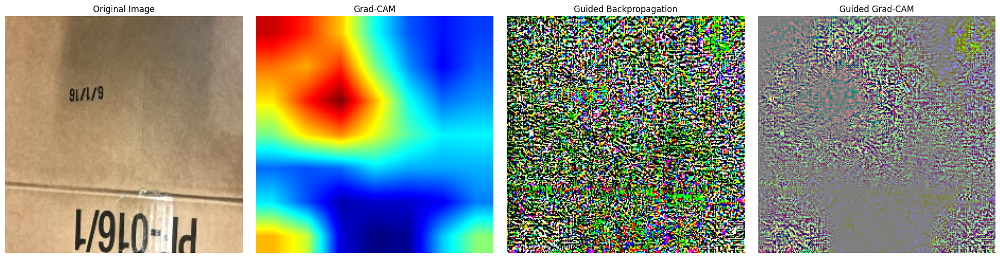

In [49]:
#{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}
image_path = '/kaggle/working/Test-Data/cardboard/28.jpg'  # Replace with your image path
guided_gradcam(model, gb, image_path, target_class_idx=0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


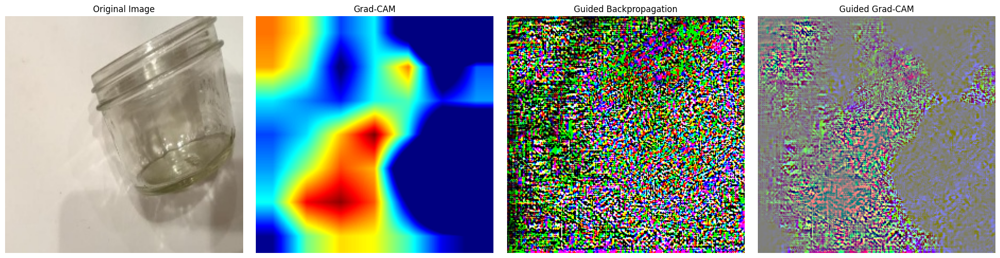

In [50]:
# Example usage
image_path = '/kaggle/working/Test-Data/glass/66.jpg'  # Replace with your image path
guided_gradcam(model, gb, image_path, target_class_idx=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


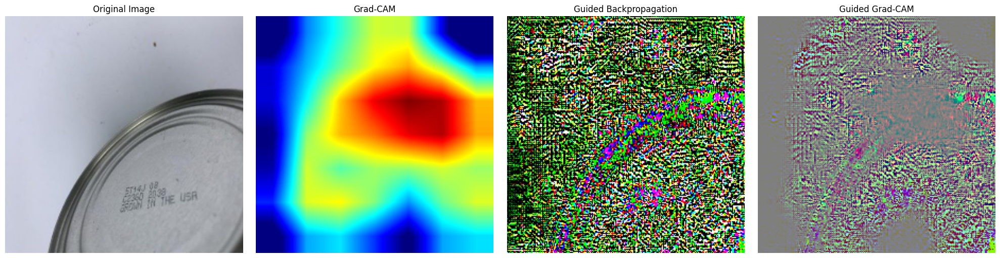

In [51]:
#{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}
image_path = '/kaggle/working/Test-Data/metal/79.jpg'  # Replace with your image path
guided_gradcam(model, gb, image_path, target_class_idx=2)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


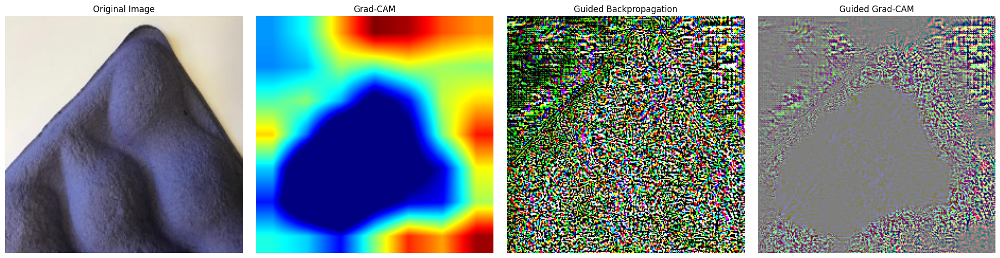

In [52]:
# Example usage
#{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}
image_path = '/kaggle/working/Test-Data/paper/62.jpg'  # Replace with your image path
guided_gradcam(model, gb, image_path, target_class_idx=3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


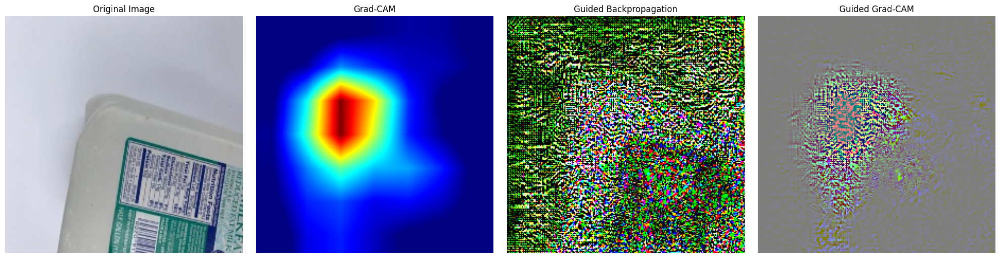

In [53]:
# Example usage
#{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}
image_path = '/kaggle/working/Test-Data/plastic/86.jpg'  # Replace with your image path
guided_gradcam(model, gb, image_path, target_class_idx=4)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


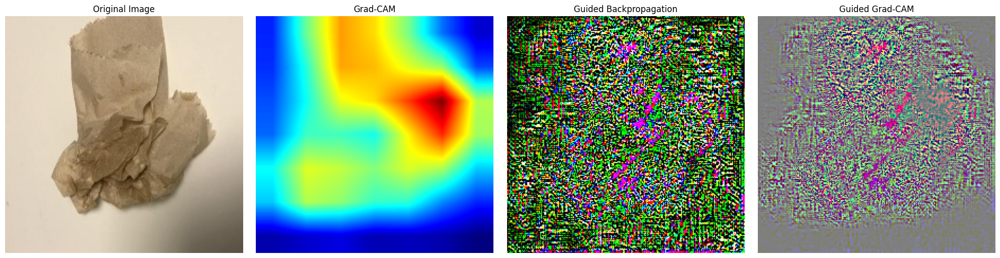

In [54]:
#{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}
image_path = '/kaggle/working/Test-Data/trash/3.jpg'  # Replace with your image path
guided_gradcam(model, gb, image_path, target_class_idx=5)